In [1]:
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pickle

In [2]:
print(torch.cuda.is_available())

False


In [3]:
# Проверяем, доступны ли GPU
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [4]:
# Загрузка DataFrame из файла
with open('../Dataset/dataset.pkl', 'rb') as f:
    df = pickle.load(f)

In [5]:
crystal = df['Crystal']
Crystal = []

for i in crystal:
    i = i[1:]
    foo, fooo = i.split(".")
    i = foo
    #print(i)
    Crystal.append(i)

In [6]:
Cr = df['Stats'].unique()

df['Crystal'] = Crystal
df = df.loc[((df['Crystal'] != 'Ag') & (df['Crystal'] != 'Au') & (df['Crystal'] != 'B4C') & (df['Crystal'] != 'H2O_ice_1h') & (df['Crystal'] != 'Hg') & (df['Crystal'] != 'Li')& (df['Crystal'] != 'LiF')& (df['Crystal'] != 'Gd'))]
df = df.loc[((df['Stats'] != Cr[0]) & (df['Stats'] != Cr[1]))]
df = df.reset_index(drop= True)
df
#segment_df = segment_df.loc[((segment_df['Crystal'] != 'Ag') & (segment_df['Crystal'] != 'Au') & (segment_df['Crystal'] != 'B4C'))]
#segment_df = segment_df.reset_index(drop= True)

,Matrix,Crystal,Stats,Pulce duration
0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",Al,50000000.0,10.000000
1,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",Al,50000000.0,25.263158
2,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",Al,50000000.0,40.526316
3,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",Al,50000000.0,55.789474
4,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",Al,50000000.0,71.052632
...,...,...,...,...
2395,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",Y2O3,500000000.0,238.947368
2396,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",Y2O3,500000000.0,254.210526
2397,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",Y2O3,500000000.0,269.473684
2398,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",Y2O3,500000000.0,284.736842


In [7]:
Crystals = df['Crystal'].unique()

koef = [0.005, 0.006, 0.0005, 0.05, 0.01, 0.0002, 0.0005, 0.0005, 0.0005, 0.0005, 0.005, 0.002, 0.02, 0.03, 0.025, 0.015, 0.01, 0.015, 0.01, 0.0001, 0.01, 0.02, 0.015, 0.01, 0.01, 0.005, 0.01, 0.0007, 0.01, 0.007, 0.005, 0.02, 0.001, 0.01, 0.01, 0.0005, 0.015, 0.0025]

k = dict(zip(Crystals, koef))

print(k)

# Добавляем новый столбец с коэффициентами
df['Coefficient'] = df['Crystal'].map(k)

{'Al': 0.005, 'Al2O3_sapphire': 0.006, 'Ba': 0.0005, 'Be': 0.05, 'BeO': 0.01, 'C_diamond': 0.0002, 'C_graphite': 0.0005, 'Cr': 0.0005, 'Cs': 0.0005, 'Cu': 0.0005, 'Cu2MnAl': 0.005, 'Fe': 0.002, 'Ga': 0.02, 'Ge': 0.03, 'He4_hcp': 0.025, 'I2': 0.015, 'K': 0.01, 'Mo': 0.015, 'Na2Ca3Al2F14': 0.01, 'Nb': 0.0001, 'Ni': 0.01, 'Pb': 0.02, 'Pt': 0.015, 'Rb': 0.01, 'Si': 0.01, 'Ti': 0.005, 'Tl': 0.01, 'UO2': 0.0007, 'Zn': 0.01, 'Y2O3': 0.007}


In [8]:
def generate_mask_background(data, k_background):
    # Нормализуем данные
    data = data / np.max(data)

    # Порог для фона
    threshold_background = k_background * np.max(data)

    # Создаем маску: фон (0) и всё остальное (2)
    mask = np.where(data > threshold_background, 2, 0)
    
    return mask

def add_beam_mask(mask):
    # Примерные координаты углов трапеции
    x1, y1 = 238, 15   # Верхний левый
    x2, y2 = 243, 15   # Верхний правый
    x3, y3 = 224, 249  # Нижний левый
    x4, y4 = 256, 249  # Нижний правый

    # Создадим маску для трапеции
    for y in range(y1, y3+1):
        left_x = int(x1 + (x3 - x1) * (y - y1) / (y3 - y1))
        right_x = int(x2 + (x4 - x2) * (y - y2) / (y4 - y2))
        mask[y, left_x:right_x] = 1  # Используем y как индекс строки, а x как индекс столбца

    return mask

In [9]:
df_seg = pd.DataFrame(columns=['Mask'])

masks = []

for i in range(len(df['Matrix'])):
    k_background = df['Coefficient'][i]
    matrix = df['Matrix'][i]
    mask = generate_mask_background(matrix, k_background)
    mask = add_beam_mask(mask)
    masks.append(mask)

df_seg['Mask'] = masks

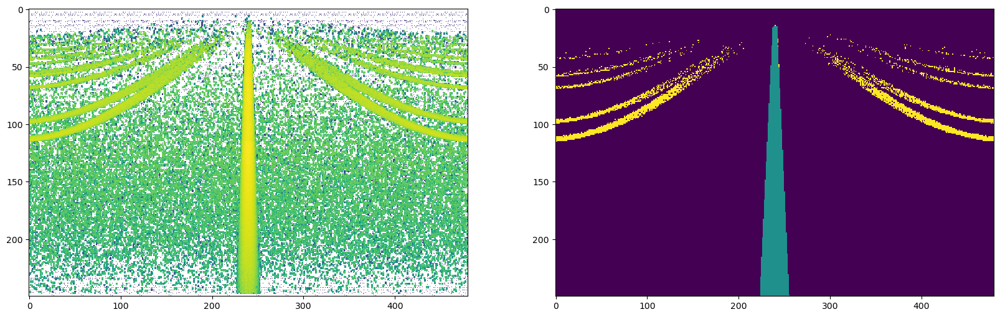

In [10]:
# Создаем фигуру и оси
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

# Первый график
ax1.imshow(df['Matrix'][23], cmap='viridis', aspect='auto', norm='log')

# Первый график
ax2.imshow(df_seg['Mask'][23], cmap='viridis', aspect='auto', interpolation='none')

plt.show()

In [11]:
mu = 300       # Среднее значение шума (можно изменить)
sigma = 0.5  # Стандартное отклонение (сила шума)

# Функция для добавления шума к одной матрице
def add_gaussian_noise(matrix, mu, sigma):
    noise = np.random.normal(mu, sigma, matrix.shape)
    return matrix + noise

# Применяем ко всем матрицам в столбце 'Matrix'
df['Matrix'] = df['Matrix'].apply(lambda mat: add_gaussian_noise(mat, mu, sigma))

In [42]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

X = df.drop(['Crystal', 'Stats', 'Pulce duration', 'Coefficient'], axis=1)

# Шаг 1: Преобразование строковых меток классов в числовые метки
label_encoder = LabelEncoder()

segmenadion_masks = df_seg

y = df['Crystal']

y_encoded = label_encoder.fit_transform(y)

Diff_train, Diff_test, Segmenation_Diff_train, Segmenation_Diff_test, y_train, y_test = train_test_split(X, segmenadion_masks, y_encoded, test_size=0.1, random_state=42)

In [43]:
# Преобразование матриц в numpy массив перед преобразованием в тензоры
Diff_train_matrices = np.array(Diff_train['Matrix'].tolist())
Diff_test_matrices = np.array(Diff_test['Matrix'].tolist())

Segmenation_Diff_train_matrices = np.array(Segmenation_Diff_train['Mask'].tolist())
Segmenation_Diff_test_matrices = np.array(Segmenation_Diff_test['Mask'].tolist())

# Преобразование данных в тензоры PyTorch
Diff_train_tensor = torch.FloatTensor(Diff_train_matrices)
Diff_train_tensor = Diff_train_tensor.unsqueeze(1)
Segmentation_Diff_train_tensor = torch.FloatTensor(Segmenation_Diff_train_matrices)
#Segmentation_Diff_train_tensor = Segmentation_Diff_train_tensor.unsqueeze(1)
y_train_tensor = torch.LongTensor(y_train)  # Используем LongTensor для целевых меток

Diff_test_tensor = torch.FloatTensor(Diff_test_matrices)
Diff_test_tensor = Diff_test_tensor.unsqueeze(1)
Segmentation_Diff_test_tensor = torch.FloatTensor(Segmenation_Diff_test_matrices)
#Segmentation_Diff_test_tensor = Segmentation_Diff_test_tensor.unsqueeze(1)
y_test_tensor = torch.LongTensor(y_test)

In [44]:
Diff_train_tensor.size()

torch.Size([31, 1, 250, 480])

In [45]:
Segmentation_Diff_train_tensor.size()

torch.Size([31, 250, 480])

In [7]:
import torch.nn as nn
import torch.nn.functional as F

# Пример модели U-Net
class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()
        self.encoder1 = self.conv_block(1, 64)
        self.encoder2 = self.conv_block(64, 128)
        self.encoder3 = self.conv_block(128, 256)
        self.encoder4 = self.conv_block(256, 512)

        self.decoder1 = self.up_conv(512, 256)
        self.decoder2 = self.up_conv(256, 128)
        self.decoder3 = self.up_conv(128, 64)
        self.decoder4 = nn.Conv2d(64, 3, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def up_conv(self, in_channels, out_channels):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            self.conv_block(out_channels, out_channels)
        )

    def forward(self, x):
        # Encoder
        e1 = self.encoder1(x)
        e2 = self.encoder2(F.max_pool2d(e1, 2))
        e3 = self.encoder3(F.max_pool2d(e2, 2))
        e4 = self.encoder4(F.max_pool2d(e3, 2))

        # Decoder
        d1 = self.decoder1(F.interpolate(e4, scale_factor=1, mode='bilinear', align_corners=True))
        d2 = self.decoder2(F.interpolate(d1 + e3, scale_factor=1, mode='bilinear', align_corners=True))
        d2 = F.pad(d2, (0, 0, 1, 0))  # (left, right, top, bottom)
        d3 = self.decoder3(F.interpolate(d2 + e2, scale_factor=1, mode='bilinear', align_corners=True))
        d4 = self.decoder4(F.interpolate(d3 + e1, scale_factor=1, mode='bilinear', align_corners=True))

        #return F.softmax(d4, dim=1)  # Применяем softmax для многоклассовой классификации
        return d4

In [47]:
from torch.utils.data import TensorDataset, DataLoader, random_split

# Создание набора данных
train_dataset = TensorDataset(Diff_train_tensor, Segmentation_Diff_train_tensor, y_train_tensor)

test_dataset = TensorDataset(Diff_test_tensor, Segmentation_Diff_test_tensor, y_test_tensor)

# Создание DataLoader для каждой выборки
train_loader = DataLoader(train_dataset, batch_size=5, shuffle=True)

test_loader = DataLoader(test_dataset, batch_size=10, shuffle=False)

In [48]:
# Пример настройки гиперпараметров и запуска обучения
model = UNet().to(device)

criterion = torch.nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, betas=(0.9, 0.99))

#optimizer = optim.Adam(model.parameters(), lr=1e-3)

In [49]:
epochs = 10
history = []
history_test = []
num_bach = 0
baches = []

In [50]:
for i in range(epochs):

  for x_batch, y_batch, class_bach in train_loader:

    num_bach+=1
    # 1. # загружаем батч данных (вытянутый в линию)
    x_batch = x_batch.to(device)
    y_batch = y_batch.to(device)

    # 2. вычисляем скор с помощью прямого распространения ( .forward or .__call__ )
    logits = model(x_batch)
    #logits = logits.squeeze(1)

    y_batch = y_batch.long()

    # 3. вычислеяем - функцию потерь (loss)
    loss = criterion(logits, y_batch)
    
    history.append(loss.item())

    # 4. вычисляем градиенты
    optimizer.zero_grad()
    loss.backward()

    # 5. шаг градиентного спуска
    optimizer.step()

  with torch.no_grad():
    for inputs, targets, class_bach in test_loader:
        inputs = inputs.to(device)
        targets = targets.to(device)
        outputs = model(inputs)  # Получаем логиты от модели

        #outputs = outputs.squeeze(1)
        targets = targets.long()

        test_loss = criterion(outputs, targets)
        history_test.append(test_loss.item())
        baches.append(num_bach)

  print(f'Epoch {i+1}, Loss: {history[-1], 2}, Loss test: {history_test[-1], 2}')

Epoch 1, Loss: (1.8016324043273926, 2), Loss test: (2.0992541313171387, 2)
Epoch 2, Loss: (1.0747703313827515, 2), Loss test: (1.7532793283462524, 2)
Epoch 3, Loss: (1.092733383178711, 2), Loss test: (1.378036379814148, 2)
Epoch 4, Loss: (0.7896084189414978, 2), Loss test: (1.1620080471038818, 2)
Epoch 5, Loss: (0.7433900833129883, 2), Loss test: (1.0484665632247925, 2)
Epoch 6, Loss: (0.7417546510696411, 2), Loss test: (1.0018588304519653, 2)
Epoch 7, Loss: (0.6153789758682251, 2), Loss test: (0.9179885983467102, 2)
Epoch 8, Loss: (0.7084727883338928, 2), Loss test: (0.8226701617240906, 2)
Epoch 9, Loss: (0.4359022378921509, 2), Loss test: (0.7383514046669006, 2)
Epoch 10, Loss: (0.37442129850387573, 2), Loss test: (0.5968273282051086, 2)


In [ ]:
torch.save(model.state_dict(), r'Dif_sematic_segmentation_weights.pth')
torch.save(model, r'Dif_sematic_segmentation.pth')

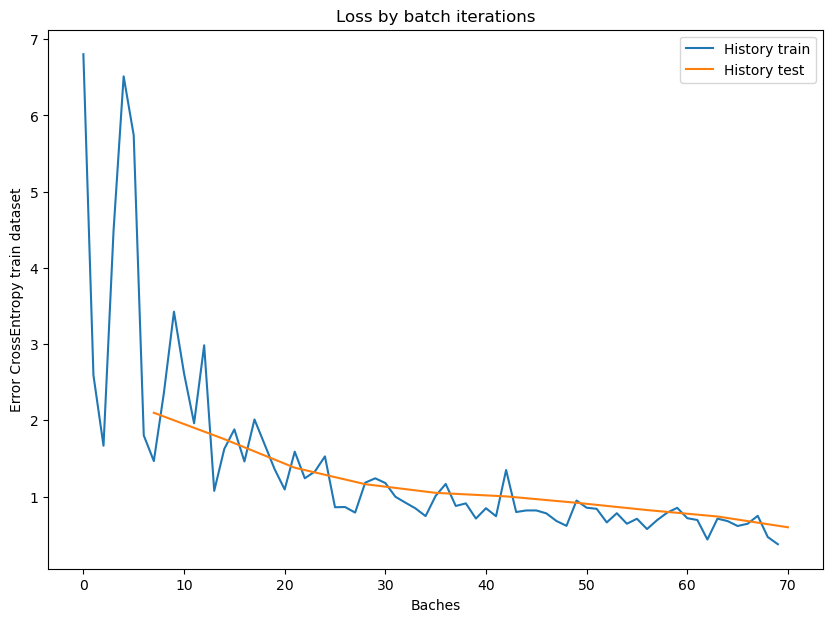

In [51]:
plt.figure(figsize=(10, 7))
plt.plot(history, label = 'History train')
plt.plot(baches, history_test, label = 'History test')
plt.title('Loss by batch iterations')
plt.ylabel('Error CrossEntropy train dataset')
plt.xlabel('Baches')
#plt.yscale('log')
#plt.xscale('log')
plt.legend()

plt.show()

In [12]:
df['Stats'].unique()

array([5.e+07, 1.e+08, 2.e+08, 5.e+08])

In [8]:
maxStats = 5.e+08
minI = max(df['Pulce duration'].unique())

df_test = df.loc[((df['Stats'] == maxStats) & (df['Pulce duration'] == minI))]
df_test = df_test.reset_index(drop= True)

#segment_df_test = segment_df.loc[((segment_df['Stats'] == maxStats) & (segment_df['Pulce duration'] == minI))]
#segment_df_test = segment_df_test.reset_index(drop= True)

# Преобразование матриц в numpy массив перед преобразованием в тензоры
df_test_matrices = np.array(df_test['Matrix'].tolist())
#Segmenation_df_test_matrices = np.array(segment_df_test['Segmendation Diff'].tolist())

# Преобразование данных в тензоры PyTorch
df_test_tensor = torch.FloatTensor(df_test_matrices)
df_test_tensor = df_test_tensor.unsqueeze(1)

#Segmenation_df_test_tensor = torch.FloatTensor(Segmenation_df_test_matrices)
#Segmenation_df_test_tensor = Segmenation_df_test_tensor.unsqueeze(1)

df_test_tensor = df_test_tensor.to(device)
#Segmenation_df_test_tensor.size()
df_test_tensor.size()

torch.Size([30, 1, 250, 480])

In [14]:
df_test

,Matrix,Crystal,Stats,Pulce duration,Coefficient
0,"[[299.64230020883446, 299.41173268485153, 300....",Al,500000000.0,300.0,0.0050
1,"[[300.15964421234895, 300.036082802329, 299.94...",Al2O3_sapphire,500000000.0,300.0,0.0060
2,"[[299.3373822037921, 300.0701971382084, 299.68...",Ba,500000000.0,300.0,0.0005
3,"[[298.86016720408, 299.8412756493436, 299.6053...",Be,500000000.0,300.0,0.0500
4,"[[300.7823335820095, 300.85010145662443, 299.5...",BeO,500000000.0,300.0,0.0100
5,"[[300.2840752282143, 300.17182202546707, 299.0...",C_diamond,500000000.0,300.0,0.0002
6,"[[300.0475563282466, 300.24628434877445, 299.9...",C_graphite,500000000.0,300.0,0.0005
7,"[[299.0871974670325, 300.15852420124526, 300.4...",Cr,500000000.0,300.0,0.0005
8,"[[300.1161507975209, 299.9283388141281, 300.26...",Cs,500000000.0,300.0,0.0005
9,"[[299.4402815098575, 300.5138016607802, 299.66...",Cu,500000000.0,300.0,0.0005


In [9]:
from torch.utils.data import TensorDataset, DataLoader, random_split
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

y_encoded = label_encoder.fit_transform(df_test['Crystal'])

y_encoded_tensor = torch.LongTensor(y_encoded)

df_test_dataset = TensorDataset(df_test_tensor, y_encoded_tensor)

# Создание DataLoader для каждой выборки
df_test_loader = DataLoader(df_test_dataset, batch_size=1, shuffle=False)

In [10]:
model = UNet().to(device)

#model.load_state_dict(torch.load('../Segmentation_NN/Dif_sematic_segmentation_weights.pth', map_location=torch.device('cpu')))
model.load_state_dict(torch.load('../Segmentation_NN/Dif_sematic_segmentation_weights_gauss_DLR.pth', map_location=torch.device('cpu')))
#model.load_state_dict(torch.load('../Segmentation_NN/Dif_sematic_segmentation_weights_gauss_DLR_1000counts.pth', map_location=torch.device('cpu')))

/var/folders/yt/7vbmq7mx6q9_q2s3p_mf_srr0000gn/T/ipykernel_73396/887798963.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('../Segmentat

<All keys matched successfully>

In [105]:
import Diffraction_generation_script as dgs

mcrun_path = "/Applications/McStas-3.3.app/Contents/Resources/mcstas/3.3/bin/"
mcstas_path = "/Applications/McStas-3.3.app/Contents/Resources/mcstas/3.3/"

do_dif = dgs.RenderPredicts(mcrun_path, mcstas_path)

Diffraction_matrix = do_dif.get_diffraction("\"Na2Ca3Al2F14.laz\"", 5E9, 300)


loading system configuration
INFO: Using directory: "/Users/artempopov/PycharmProjects/ML_Project/DifClassification/Diffraction_imshow_2"
INFO: Regenerating c-file: Diffraction_imshow.c
CFLAGS=
      
 The parameter format of powdern is initialized 
 using a static {,,,} vector.
  -> Such static vectors support literal numbers ONLY.
  -> Any vector use of variables or defines must happen via a 
     DECLARE/INITIALIZE pointer.


-----------------------------------------------------------

Generating single GPU kernel or single CPU section layout: 

-----------------------------------------------------------

Generating GPU/CPU -DFUNNEL layout:

-----------------------------------------------------------
INFO: Recompiling: ./Diffraction_imshow.out
./Diffraction_imshow.c:14115:48: warning: format string is not a string literal (potentially insecure) [-Wformat-security]
  if (!strcmp(filename,"\0")) sprintf(filename,NAME_CURRENT_COMP);
                                               ^~~~~

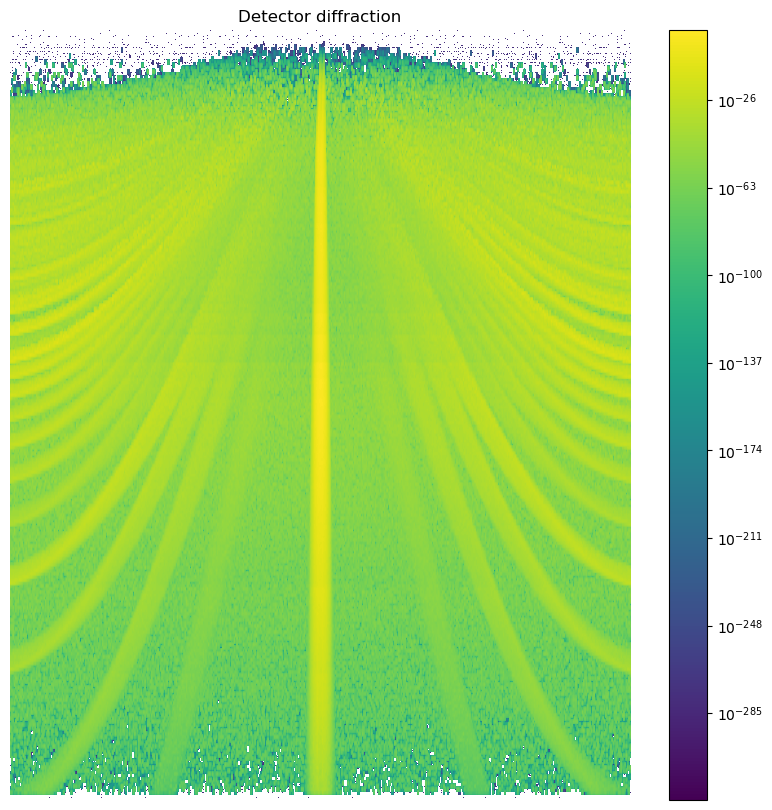

In [106]:
plt.figure(figsize=(10, 10))
plt.imshow(Diffraction_matrix, cmap='viridis', aspect='auto', norm = 'log')
plt.title("Detector diffraction")
plt.axis('off')
plt.colorbar()
plt.show()

In [107]:
Diffraction_matrix_tensor = torch.FloatTensor(Diffraction_matrix)

print(Diffraction_matrix_tensor.size())
Diffraction_matrix_tensor = Diffraction_matrix_tensor.unsqueeze(0)
Diffraction_matrix_tensor = Diffraction_matrix_tensor.unsqueeze(0)
print(Diffraction_matrix_tensor.size())

torch.Size([250, 480])
torch.Size([1, 1, 250, 480])


In [108]:
torch.save(Diffraction_matrix_tensor, 'Test_Na2Ca3Al2F14_Diffraction_matrix_tensor.pt')

In [24]:
# test crystals - C_graphite Na2Ca3Al2F14

Diffraction_matrix_tensor = torch.load('Test_C_graphite_Diffraction_matrix_tensor.pt')

/var/folders/yt/7vbmq7mx6q9_q2s3p_mf_srr0000gn/T/ipykernel_73396/4188658255.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  Diffraction_matrix_tensor = torch.load('Test_

In [25]:
Diffraction_matrix = Diffraction_matrix_tensor[0][0].numpy()

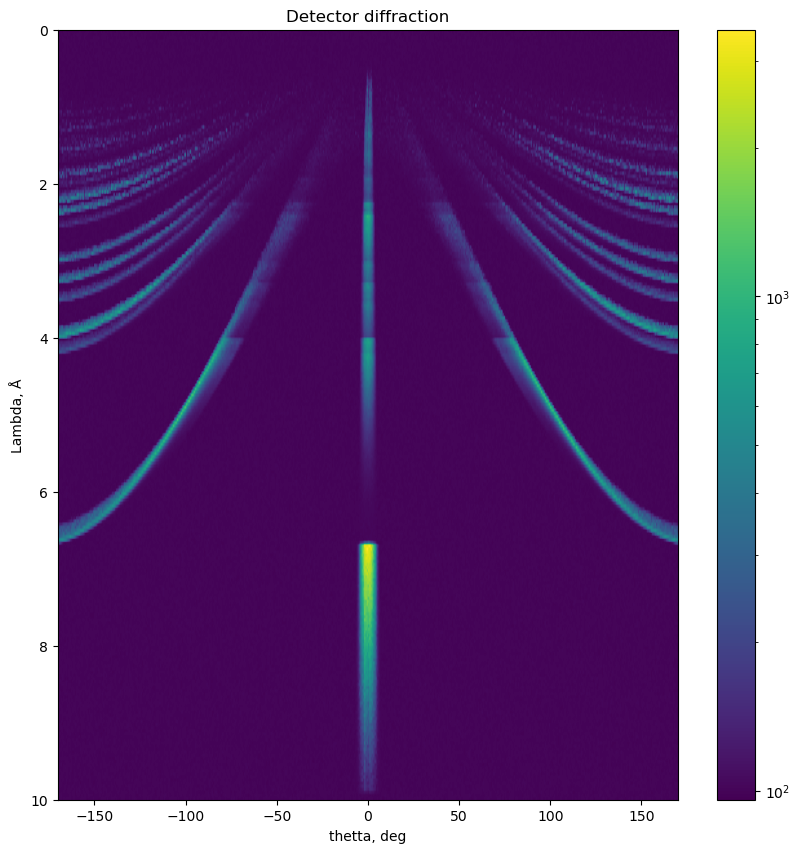

In [26]:
import numpy as np

matrix = np.array(Diffraction_matrix)
mu = 100       # Среднее значение шума (можно сделать 5, если нужно смещение)
sigma = 1    # Стандартное отклонение (разброс шума)

# Генерируем шум той же формы, что и матрица
noise = np.random.normal(mu, sigma, matrix.shape)

# Добавляем шум к матрице
result = matrix + noise

plt.figure(figsize=(10, 10))
plt.imshow(result, cmap='viridis', aspect='auto', norm = 'log', extent=(-170, 170, 10, 0))
plt.title("Detector diffraction")
#plt.axis('off')
plt.xlabel('thetta, deg')
plt.ylabel('Lambda, Å')
plt.colorbar()
plt.show()

In [45]:
np.save('C_graphite_test_diffraction_numpy.npy', result)

In [27]:
result_tensor = torch.FloatTensor(result)

print(result_tensor.size())
result_tensor = result_tensor.unsqueeze(0)
result_tensor = result_tensor.unsqueeze(0)
print(result_tensor.size())

torch.Size([250, 480])
torch.Size([1, 1, 250, 480])


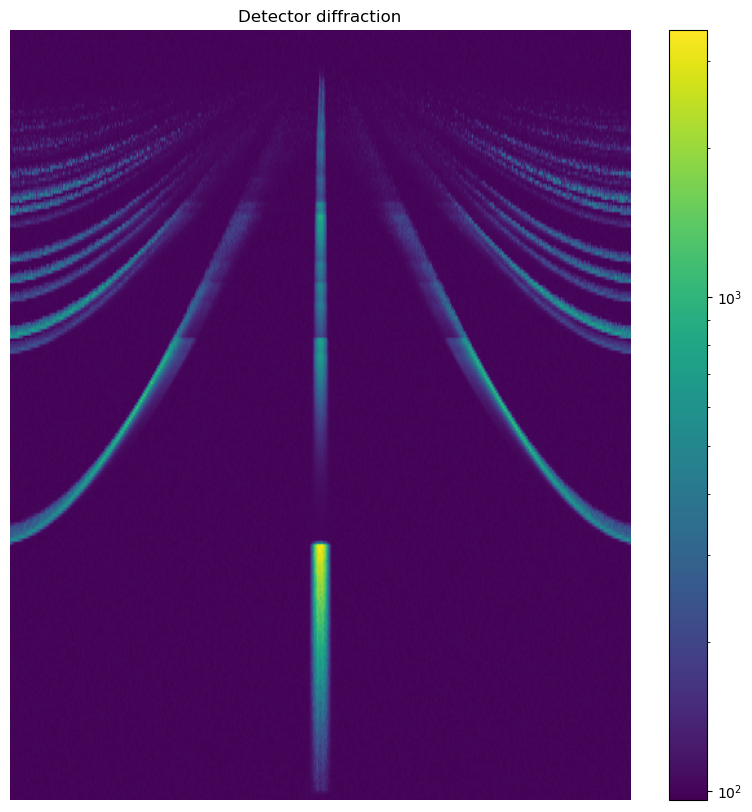

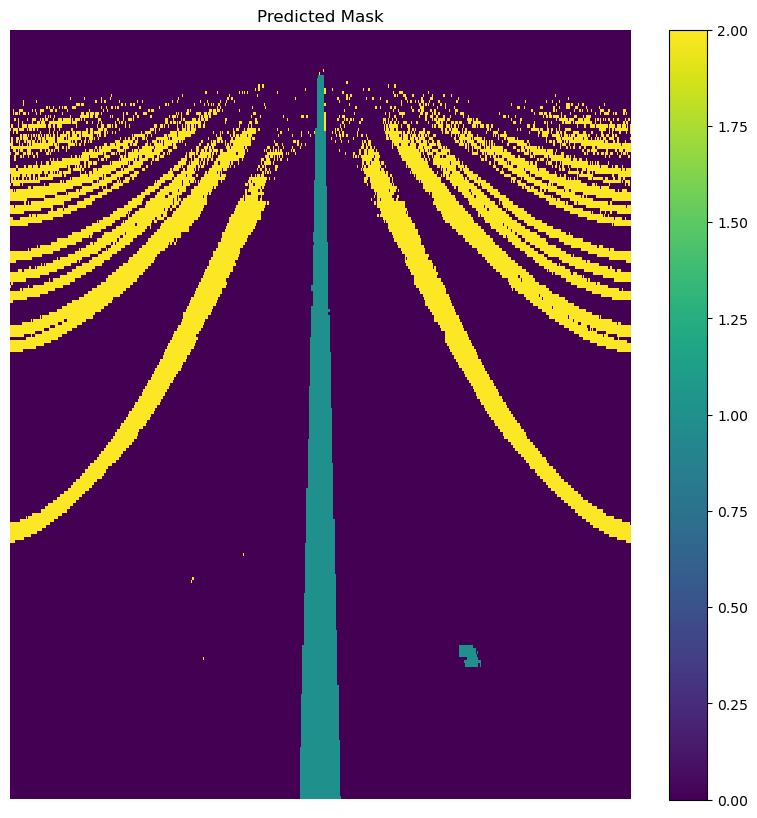

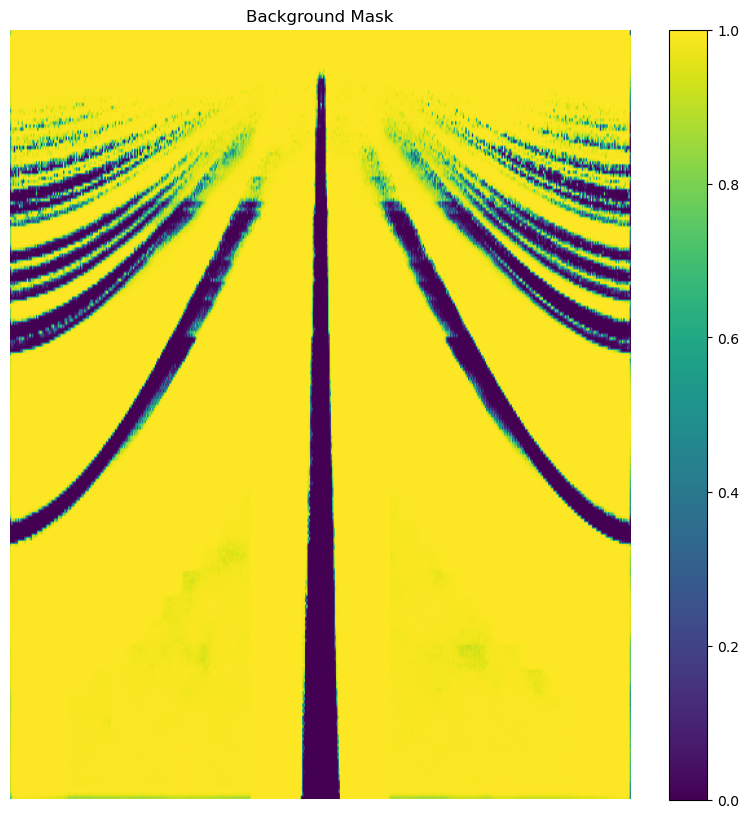

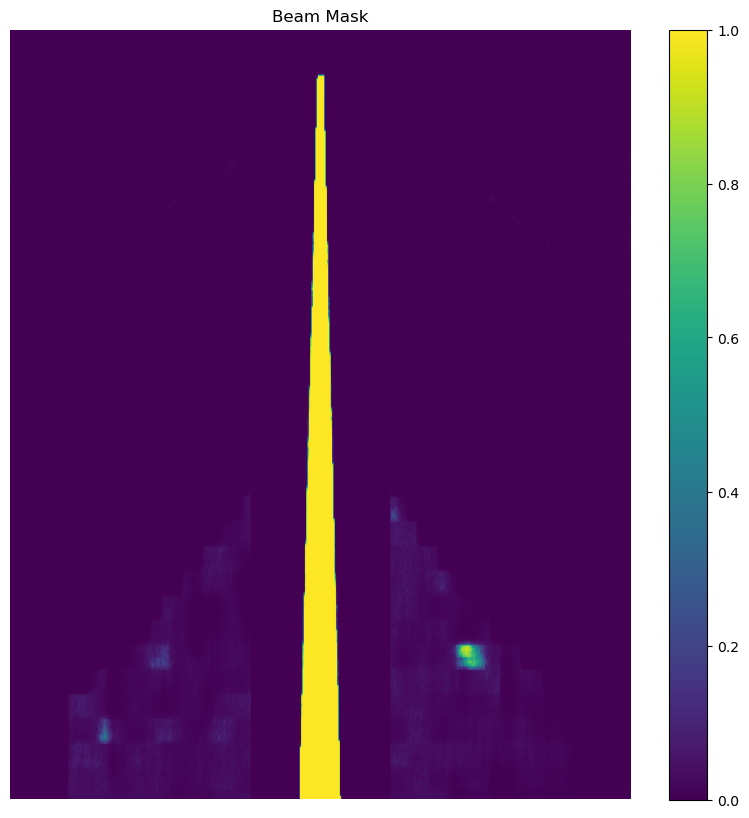

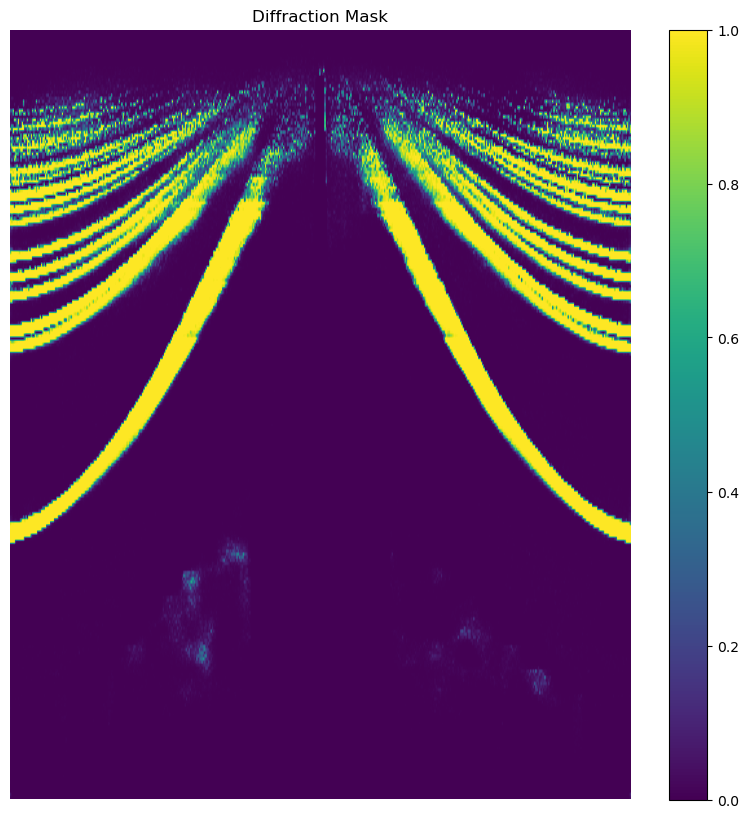

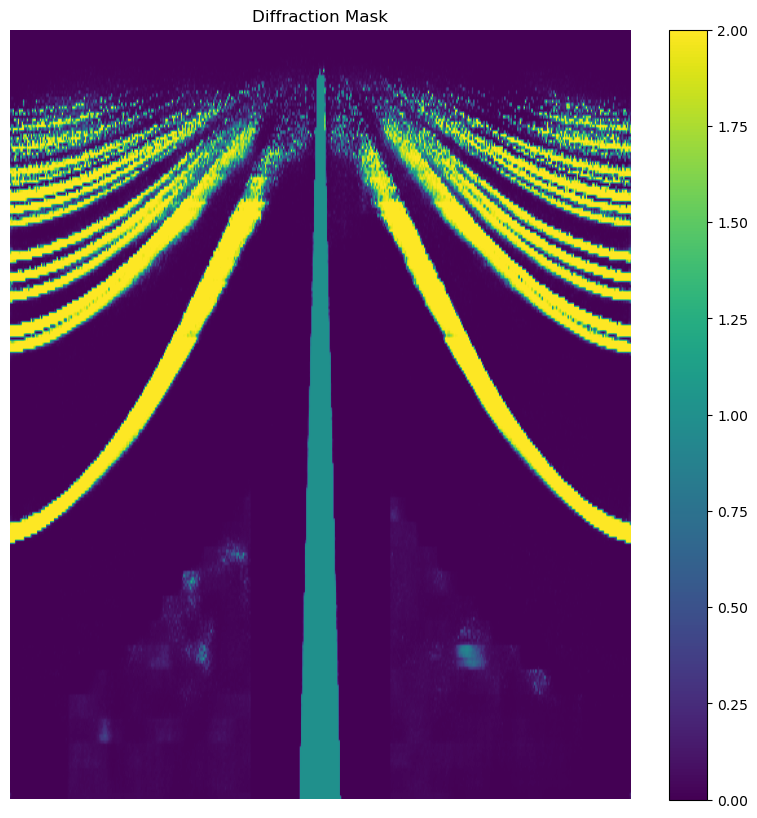

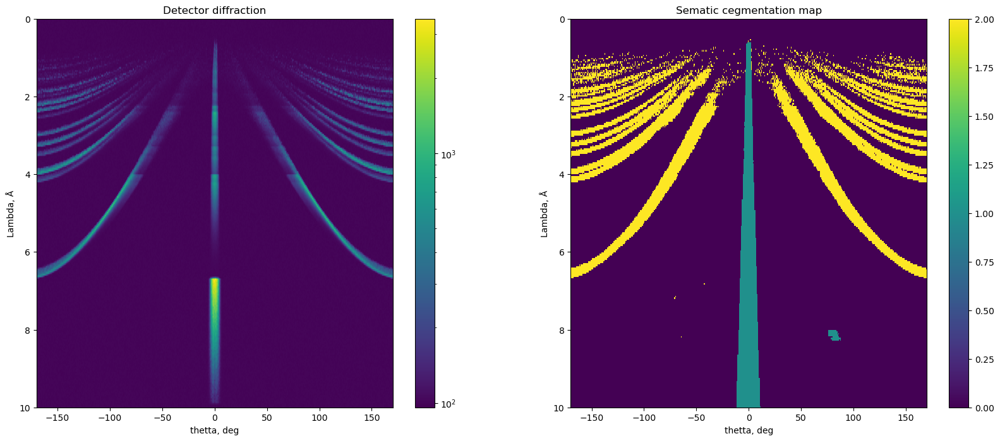

In [28]:
with torch.no_grad():
    # Применяем фильтр к целевому объекту
    output = model(result_tensor)

out = F.softmax(output, dim=1)
predicted_mask = torch.argmax(F.softmax(output, dim=1), dim=1)[0]  # Размер [height, width]
#background = out[0][0]
background = torch.sigmoid(output[0][0])
beam = out[0][1]
#beam = torch.sigmoid(output[0][1])
diff = out[0][2]
#diff = torch.sigmoid(output[0][2])

# Преобразуем в numpy для визуализации
predicted_mask = predicted_mask.cpu().numpy()  # Переносим на CPU и в numpy

background = background.cpu().numpy()  # Переносим на CPU и в numpy
beam = beam.cpu().numpy()  # Переносим на CPU и в numpy
diff = diff.cpu().numpy()  # Переносим на CPU и в numpy

# Визуализируем итоговую маску
plt.figure(figsize=(10, 10))
plt.imshow(result, cmap='viridis', aspect='auto', norm = 'log')
plt.title("Detector diffraction")
plt.axis('off')
plt.colorbar()
plt.show()

# Визуализируем итоговую маску
plt.figure(figsize=(10, 10))
plt.imshow(predicted_mask, cmap='viridis', aspect='auto', interpolation='none')
plt.title("Predicted Mask")
plt.axis('off')
plt.colorbar()
plt.show()

plt.figure(figsize=(10, 10))
plt.imshow(background, cmap='viridis', aspect='auto')
plt.title("Background Mask")
plt.axis('off')
plt.colorbar()
plt.show()

plt.figure(figsize=(10, 10))
plt.imshow(beam, cmap='viridis', aspect='auto')
plt.title("Beam Mask")
plt.axis('off')
plt.colorbar()
plt.show()

#diff[diff < 0.2] = 0
plt.figure(figsize=(10, 10))
plt.imshow(diff, cmap='viridis', aspect='auto')
plt.title("Diffraction Mask")
plt.axis('off')
plt.colorbar()
plt.show()

ans = diff*2 + beam
plt.figure(figsize=(10, 10))
plt.imshow(ans, cmap='viridis', aspect='auto')
plt.title("Diffraction Mask")
plt.axis('off')
plt.colorbar()
plt.show()

# Создаем фигуру и оси
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Первый график
im1 = ax1.imshow(result, cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
ax1.set_title("Detector diffraction")
ax1.set_xlabel('thetta, deg')
ax1.set_ylabel('Lambda, Å')
plt.colorbar(im1)

# Первый график
im2 = ax2.imshow(predicted_mask, cmap='viridis', aspect='auto', interpolation='none', extent=(-170, 170, 10, 0))
ax2.set_title("Sematic cegmentation map")
ax2.set_xlabel('thetta, deg')
ax2.set_ylabel('Lambda, Å')
plt.colorbar(im2)

plt.show()

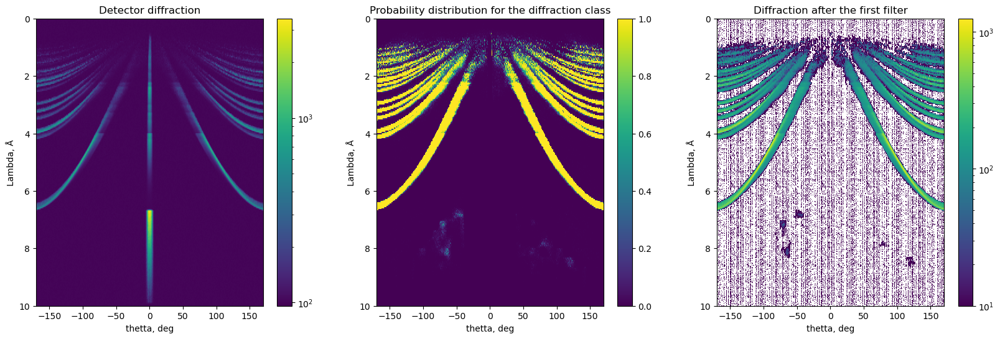

In [29]:
# Создаем фигуру и оси
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6))

# Первый график
im1 = ax1.imshow(result, cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
ax1.set_title("Detector diffraction")
ax1.set_xlabel('thetta, deg')
ax1.set_ylabel('Lambda, Å')
plt.colorbar(im1)

# Первый график
im2 = ax2.imshow(diff, cmap='viridis', aspect='auto', interpolation='none', extent=(-170, 170, 10, 0))
ax2.set_title("Probability distribution for the diffraction class")
ax2.set_xlabel('thetta, deg')
ax2.set_ylabel('Lambda, Å')
plt.colorbar(im2)

fill_1 = matrix_multiplication_with_threshold(
        diff, 
        result, 
        threshold=0.1
    )

im3 = ax3.imshow(fill_1, cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
ax3.set_title("Diffraction after the first filter")
ax3.set_xlabel('thetta, deg')
ax3.set_ylabel('Lambda, Å')
plt.colorbar(im3)

plt.show()

In [20]:
import models

first_filter = models.UNet().to(device)

first_filter.load_state_dict(torch.load('../Segmentation_NN/model_weights_withoutBeam_unique.pth', map_location=torch.device('cpu')))

resolution_scaler = models.SuperResolutionCNN().to(device)

resolution_scaler.load_state_dict(torch.load('../Segmentation_NN/upscaler_weights.pth', map_location=torch.device('cpu')))

presigion_filter = models.PH_UNet().to(device)

presigion_filter.load_state_dict(torch.load('../Segmentation_NN/UNET_precision_filter_weights.pth', map_location=torch.device('cpu')))

/var/folders/yt/7vbmq7mx6q9_q2s3p_mf_srr0000gn/T/ipykernel_73396/2147893346.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  first_filter.load_state_dict(torch.load('../S

<All keys matched successfully>

In [18]:
def generate_mask(data, k):

    # Если данные не нормализованы, нормализуйте их
    data = data / np.max(data)

    # Устанавливаем порог на уровне 0.01 от максимального значения
    threshold = k * np.max(data)
    #threshold = 0.00000001 # Старое значение
    #threshold = 0.0001
    # Генерация маски: 1 для сигнала, 0 для фона
    mask = np.where(data > threshold, 1, 0)
    return mask

def split_matrix_into_16(matrix):
    """Функция для разделения матрицы на 16 равных частей."""
    h, w = matrix.shape
    patches = []
    
    # Шаги для разделения по высоте и ширине
    patch_height = h // 4  # 480 // 4 = 120
    patch_width = w // 4   # 250 // 4 = 62
    
    for i in range(0, h, patch_height):
        for j in range(0, w, patch_width):
            patch = matrix[i:i + patch_height, j:j + patch_width]
            patches.append(patch)
    
    return patches

def split_matrix_into_64(matrix):
    """Функция для разделения матрицы на 16 равных частей."""
    h, w = matrix.shape
    patches = []
    
    # Шаги для разделения по высоте и ширине
    patch_height = h // 8  # 480 // 4 = 120
    patch_width = w // 8   # 250 // 4 = 62
    
    for i in range(0, h, patch_height):
        for j in range(0, w, patch_width):
            patch = matrix[i:i + patch_height, j:j + patch_width]
            patches.append(patch)
    
    return patches

def combine_patches_16(patches, original_shape=(500, 960)):
    """Сборка матрицы из 16 блоков."""
    h, w = original_shape
    patch_height = h // 4
    patch_width = w // 4
    new_matrix = np.zeros(original_shape)
    
    patch_idx = 0
    for i in range(0, h, patch_height):
        for j in range(0, w, patch_width):
            new_matrix[i:i + patch_height, j:j + patch_width] = patches[patch_idx]
            patch_idx += 1
            
    return new_matrix

def combine_patches_64(patches, original_shape=(1000, 1920)):
    """Сборка матрицы из 16 блоков."""
    h, w = original_shape
    patch_height = h // 8
    patch_width = w // 8
    new_matrix = np.zeros(original_shape)
    
    patch_idx = 0
    for i in range(0, h, patch_height):
        for j in range(0, w, patch_width):
            new_matrix[i:i + patch_height, j:j + patch_width] = patches[patch_idx]
            patch_idx += 1
            
    return new_matrix

def matrix_multiplication_with_threshold(A, B, threshold=0.1):
    # Применяем пороговое значение: если элемент меньше порога, он становится 0
    A = np.where(A < threshold, 0, A)
    
    # Умножаем матрицы
    result = A * B
    
    return result

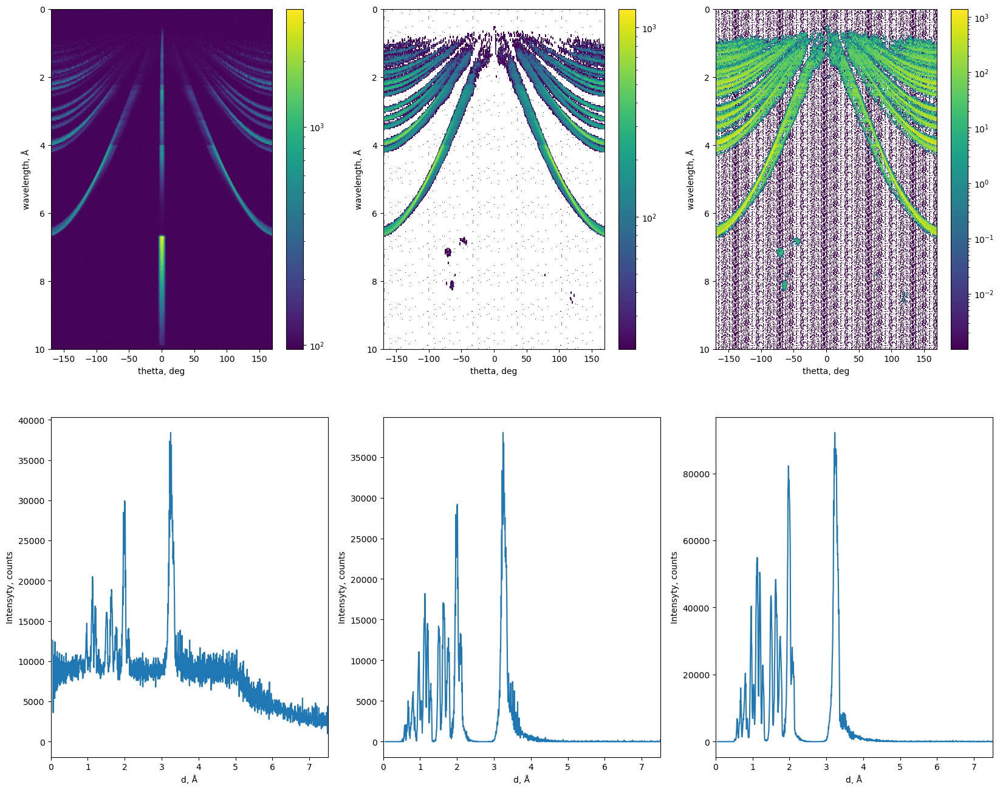

In [30]:
import DiffQ as DQ

# Предварительная инициализация Qwrapper
Qplotter_low_res = DQ.Qwrapper(480, 250)
Qplotter_high_res = DQ.Qwrapper(960, 500)

crystal = 'C_graphite'
cr = 0

threshold_1 = 0.1
threshold_2 = 0.7
ADC_chanales = 45000

with torch.no_grad():
    # Применяем фильтр к целевому объекту
    output = model(result_tensor)
    out = F.softmax(output, dim=1)
    predicted_mask = torch.argmax(F.softmax(output, dim=1), dim=1)[0]  # Размер [height, width]
    diff = out[0][2]
    diff = diff.cpu().numpy()  # Переносим на CPU и в numpy
    diff[diff < 0.2] = 0
    
    # Выполняем операцию умножения с порогом
    pre_res = matrix_multiplication_with_threshold(
        diff, 
        result_tensor[0][0].cpu().numpy(), 
        threshold=threshold_1
    )

    # Преобразуем результат обратно в тензор
    pre_res = torch.FloatTensor(pre_res).unsqueeze(0).unsqueeze(0).to(device)

    # Масштабируем разрешение
    high_res = resolution_scaler(pre_res)

for i in range(len(high_res)):
    target = result_tensor[i][0].cpu().numpy()
    old = target  # Оригинал для дальнейшего сравнения

    # Разделение изображения на патчи
    patches = split_matrix_into_16(high_res[i][0].cpu().numpy())
    patches = torch.FloatTensor(patches).to(device).unsqueeze(1)

    with torch.no_grad():
        out = presigion_filter(patches)

    # Сжимаем результаты обратно
    out = out.squeeze(1)

    # Графическая визуализация
    fig, axes = plt.subplots(2, 3, figsize=(20, 16))
    ax1, ax2, ax3 = axes[0]  # Первая строка осей
    ax4, ax5, ax6 = axes[1]  # Вторая строка осей

    # Первый график - Оригинал
    #plt.figure()
    im1 = ax1.imshow(target, cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
    #ax1.set_title(f'{crystal} powder diffraсtion before processing')
    ax1.set_ylabel('wavelength, Å')
    ax1.set_xlabel('thetta, deg')
    plt.colorbar(im1)
    q1, I1 = Qplotter_low_res.getQDIFADC(target, 6 * ADC_chanales)
    #q1, I1 = Qplotter_low_res.getQDIFSORT(target)
    ax4.plot(q1, I1)
    #ax4.set_yscale('log')
    ax4.set_xlim(0,7.5)
    #ax4.set_title(f'{crystal} results in d space before processing')
    ax4.set_xlabel('d, Å')
    ax4.set_ylabel('Intensyty, counts')

    # Второй график - Результат фильтрации
    F_1 = pre_res[i][0].cpu().numpy()
    im2 = ax2.imshow(F_1, cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
    #ax2.set_title(f'{crystal} powder diffraсtion after first filter')
    ax2.set_ylabel('wavelength, Å')
    ax2.set_xlabel('thetta, deg')
    plt.colorbar(im2)
    q2, I2 = Qplotter_low_res.getQDIFADC(F_1, 6 * ADC_chanales)
    #q2, I2 = Qplotter_low_res.getQDIFSORT(F_1)
    ax5.plot(q2, I2)
    #ax5.set_yscale('log')
    ax5.set_xlim(0,7.5)
    #ax5.set_title(f'{crystal} results in d space after first filter')
    ax5.set_xlabel('d, Å')
    ax5.set_ylabel('Intensyty, counts')

    # Третий график - Восстановленный результат
    Upscaled = combine_patches_16(out.cpu().numpy())
    Result = matrix_multiplication_with_threshold(Upscaled, high_res[i][0].cpu().numpy(), threshold=threshold_2)
    # Заменим все отрицательные элементы на нули
    Result[Result < 0] = 0
    im3 = ax3.imshow(Result, cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
    #ax3.set_title(f'{crystal} powder diffraсtion after Upscaler and presigion filter')
    ax3.set_ylabel('wavelength, Å')
    ax3.set_xlabel('thetta, deg')
    plt.colorbar(im3)
    q3, I3 = Qplotter_high_res.getQDIFADC(Result, 12 * ADC_chanales)
    #q3, I3 = Qplotter_high_res.getQDIFSORT(Result)
    ax6.plot(q3, I3)
    #ax6.set_yscale('log')
    ax6.set_xlim(0,7.5)
    #ax6.set_title(f'{crystal} results in d space after Upscaler and presigion filter')
    ax6.set_xlabel('d, Å')
    ax6.set_ylabel('Intensyty, counts')

    plt.show()

In [31]:
import pandas as pd

# Фильтрация по условию q1 <= 8
mask = q2 <= 8
q2_filtered = q2[mask]
I2_filtered = I2[mask]

# Создаём DataFrame
df = pd.DataFrame({
    'd': q2_filtered,
    'I': I2_filtered
})

# Сохраняем в CSV
df.to_csv('C_graphite_test_d_space_mid_filtered_diffracion.csv', index=False)

In [46]:
import pandas as pd

# Фильтрация по условию q1 <= 30
mask = q1 <= 30
q1_filtered = q1[mask]
I1_filtered = I1[mask]

# Создаём DataFrame
df = pd.DataFrame({
    'd': q1_filtered,
    'I': I1_filtered
})

# Сохраняем в CSV
df.to_csv('C_graphite_test_d_space_non_filtered_diffracion.csv', index=False)

mask = q3 <= 30
q3_filtered = q3[mask]
I3_filtered = I3[mask]

# Создаём DataFrame
df = pd.DataFrame({
    'd': q3_filtered,
    'I': I3_filtered
})

# Сохраняем в CSV
df.to_csv('C_graphite_test_d_space_filtered_diffracion.csv', index=False)


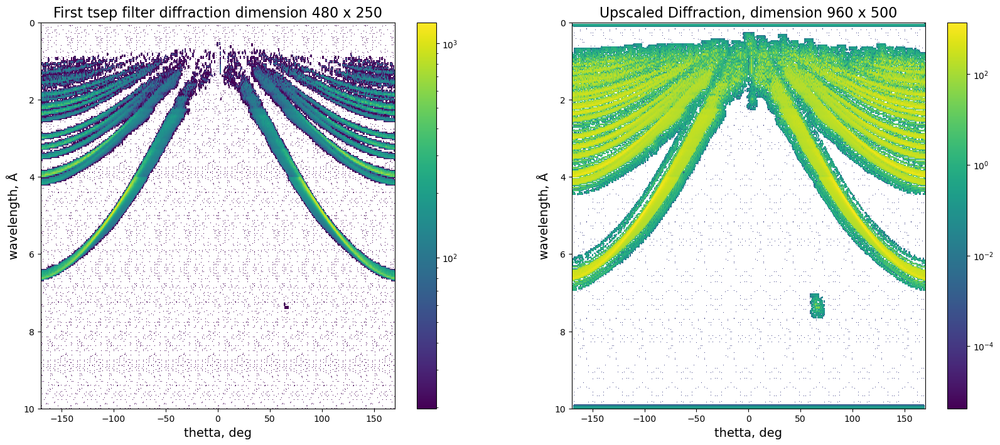

In [101]:
# Создаем фигуру и оси для визуализации
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

im1 = ax1.imshow(F_1, cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
ax1.set_ylabel('wavelength, Å', fontsize=14)
ax1.set_xlabel('thetta, deg', fontsize=14)
ax1.set_title('First tsep filter diffraction dimension 480 x 250', fontsize=16)
plt.colorbar(im1)

hrr = high_res[0][0].cpu().numpy()
hrr[hrr < 0] = 0

im2 = ax2.imshow(high_res[0][0].cpu().numpy(), cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
ax2.set_ylabel('wavelength, Å', fontsize=14)
ax2.set_xlabel('thetta, deg' ,fontsize=14)
ax2.set_title('Upscaled Diffraction, dimension 960 x 500', fontsize=16)
plt.colorbar(im2)

plt.show()

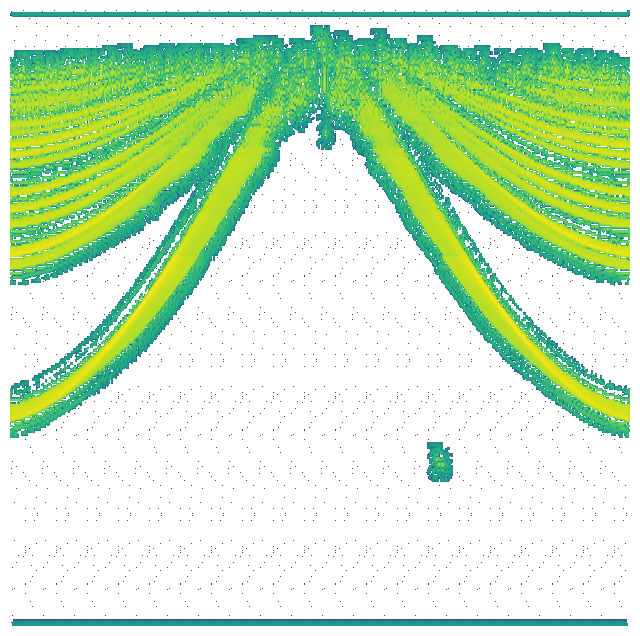

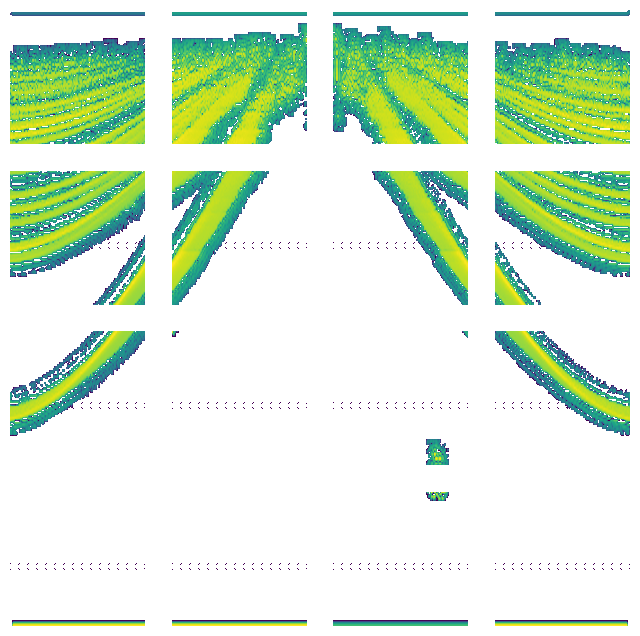

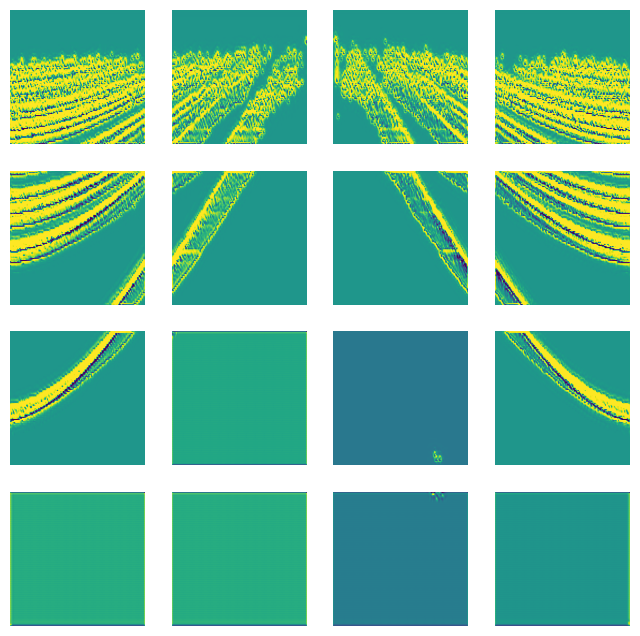

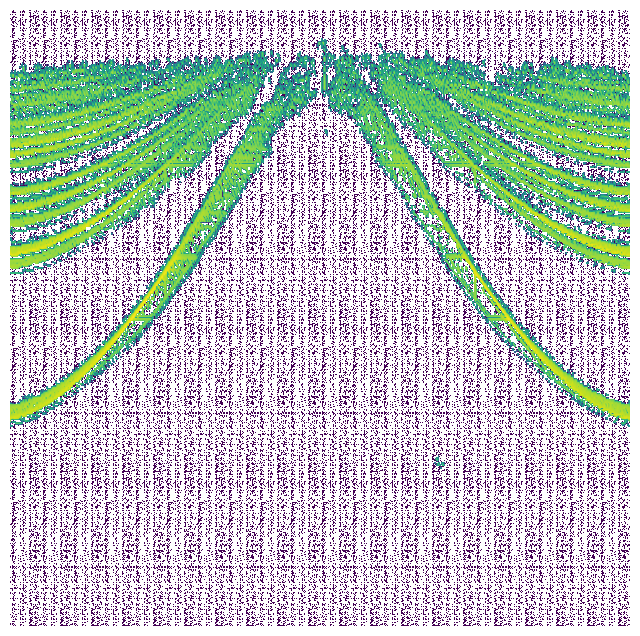

In [104]:
hrr = high_res[0][0].cpu().numpy()
hrr[hrr < 0] = 0
plt.figure(figsize=(8, 8))
plt.imshow(high_res[0][0].cpu().numpy(), cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
plt.axis('off')
#plt.ylabel('wavelength, Å', fontsize=14)
#plt.xlabel('thetta, deg' ,fontsize=14)
#plt.title('Upscaled Diffraction, dimension 960 x 500', fontsize=16)
#plt.colorbar()
plt.show()

# Разделение изображения на патчи
patches = split_matrix_into_16(high_res[0][0].cpu().numpy())

# Вывод всех патчей на график в сетке 4x4
fig, axes = plt.subplots(4, 4, figsize=(8, 8))
for j, ax in enumerate(axes.flat):   
    patch = patches[j]
    patch[patch < 0] = 0
    im = ax.imshow(patch, cmap='viridis', aspect='auto', norm='log')
    ax.axis('off')
#plt.title('Splited to patches Upscaled Diffraction', fontsize=16)
plt.show()

# Вывод всех патчей на график в сетке 4x4
fig, axes = plt.subplots(4, 4, figsize=(8, 8))
for j, ax in enumerate(axes.flat):   
    patch = out[j]
    patch[patch < 0] = 0
    im = ax.imshow(patch, cmap='viridis', aspect='auto')
    ax.axis('off')
#plt.title('Activation mask  of splited to patches Upscaled Diffraction', fontsize=16)
plt.show()

Result[Result < 0] = 0
plt.figure(figsize=(8, 8))
plt.imshow(Result, cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
plt.axis('off')
#plt.ylabel('wavelength, Å', fontsize=14)
#plt.xlabel('thetta, deg' ,fontsize=14)
#plt.title('Result Diffraction', fontsize=16)
#plt.colorbar()
plt.show()

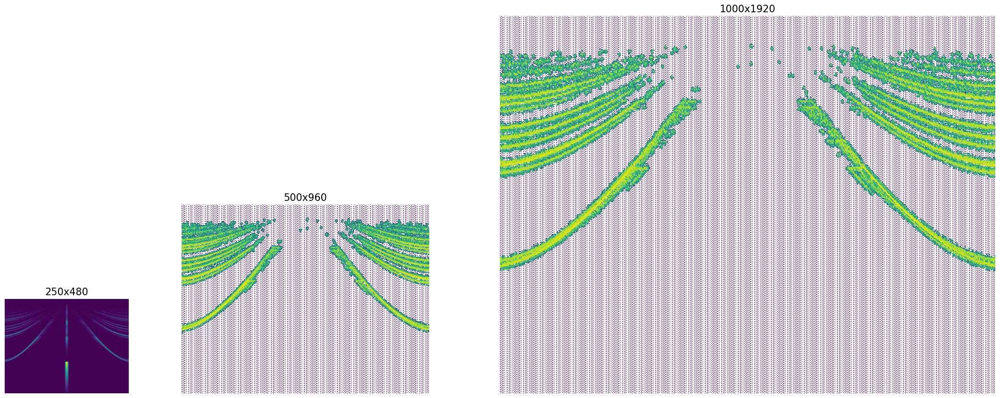

In [89]:
import DiffQ as DQ

# Предварительная инициализация Qwrapper
Qplotter_low_res = DQ.Qwrapper(480, 250)
Qplotter_high_res = DQ.Qwrapper(960, 500)

threshold_1 = 0.3
threshold_2 = 0.75
ADC_chanales = 512

with torch.no_grad():
    # Применяем фильтр к целевому объекту
    output = model(result_tensor)
    out = F.softmax(output, dim=1)
    predicted_mask = torch.argmax(F.softmax(output, dim=1), dim=1)[0]  # Размер [height, width]
    diff = out[0][2]
    diff = diff.cpu().numpy()  # Переносим на CPU и в numpy
    diff[diff < 0.2] = 0
    
    # Выполняем операцию умножения с порогом
    pre_res = matrix_multiplication_with_threshold(
        diff, 
        result_tensor[0][0].cpu().numpy(), 
        threshold=threshold_1
    )

    # Преобразуем результат обратно в тензор
    pre_res = torch.FloatTensor(pre_res).unsqueeze(0).unsqueeze(0).to(device)

    # Масштабируем разрешение
    high_res = resolution_scaler(pre_res)

for i in range(len(high_res)):
    target = result_tensor[i][0].cpu().numpy()
    old = target  # Оригинал для дальнейшего сравнения

    # Разделение изображения на патчи
    patches = split_matrix_into_16(high_res[i][0].cpu().numpy())
    patches = torch.FloatTensor(patches).to(device).unsqueeze(1)

    with torch.no_grad():
        out = presigion_filter(patches)

    # Сжимаем результаты обратно
    out = out.squeeze(1)

    # Третий график - Восстановленный результат
    Upscaled = combine_patches_16(out.cpu().numpy())
    Result = matrix_multiplication_with_threshold(Upscaled, high_res[i][0].cpu().numpy(), threshold=threshold_2)
    Result[Result < 0] = 0

    # Задаем разные размеры подграфиков пропорционально размерам матриц
    fig = plt.figure(figsize=(15, 10))

    # Добавляем три подграфика с соответствующими размерами
    ax1 = fig.add_axes([0.05, 0.1, 0.175, 0.2])  # Маленький подграфик для 250x480
    ax2 = fig.add_axes([0.30, 0.1, 0.35, 0.4])  # Средний подграфик для 500x960
    ax3 = fig.add_axes([0.75, 0.1, 0.7, 0.8])   # Большой подграфик для 1000x1920

    # Отображение каждой матрицы с сохранением их соотношения сторон
    ax1.imshow(target, cmap='viridis', aspect='auto', norm='log')
    ax1.set_title('250x480', fontsize=15)
    ax1.axis('off')

    ax2.imshow(Result, cmap='viridis', aspect='auto', norm='log')
    ax2.set_title('500x960', fontsize=15)
    ax2.axis('off')

    Result_4_next = torch.FloatTensor(Result)
    Result_4_next = Result_4_next.unsqueeze(0)
    Result_4_next = Result_4_next.unsqueeze(0)
    Result_4_next = Result_4_next.to(device)

    # Масштабируем разрешение
    high_res_new = resolution_scaler(Result_4_next)

    # Разделение изображения на патчи
    patches = split_matrix_into_64(high_res_new[0][0].cpu().detach().numpy())
    patches = torch.FloatTensor(patches).to(device).unsqueeze(1)

    with torch.no_grad():
        out_new = presigion_filter(patches)

    # Сжимаем результаты обратно
    out_new = out_new.squeeze(1)

    # Третий график - Восстановленный результат
    Upscaled = combine_patches_64(out_new.cpu().numpy())
    Result_new = matrix_multiplication_with_threshold(Upscaled, high_res_new[0][0].cpu().detach().numpy(), threshold=0.75)
    Result_new[Result_new < 0] = 0

    ax3.imshow(Result_new, cmap='viridis', aspect='auto', norm='log')
    ax3.set_title('1000x1920', fontsize=15)
    ax3.axis('off')

    # Показываем результат
    plt.show()

torch.Size([1, 1, 250, 480])


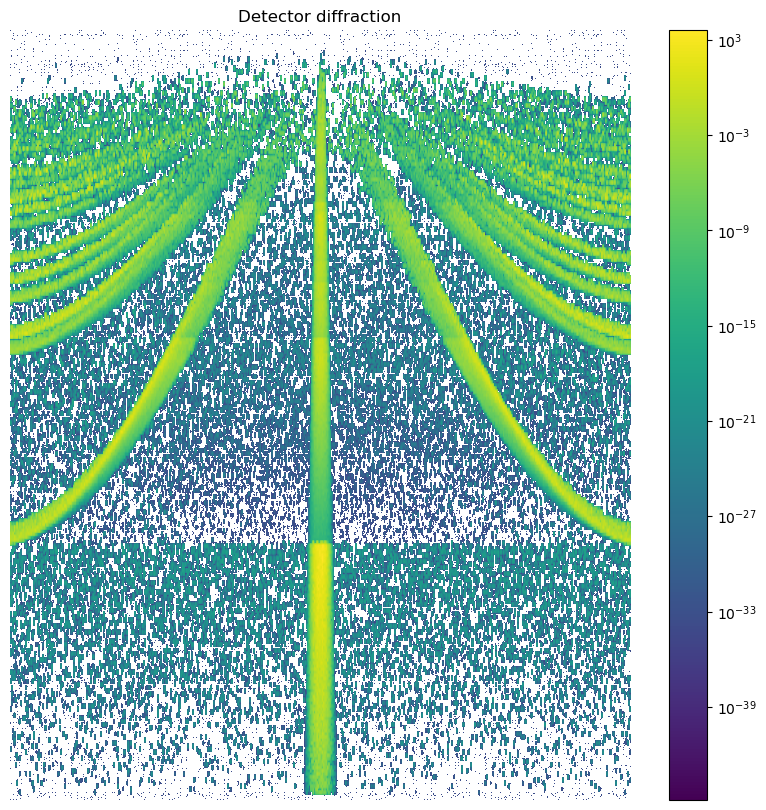

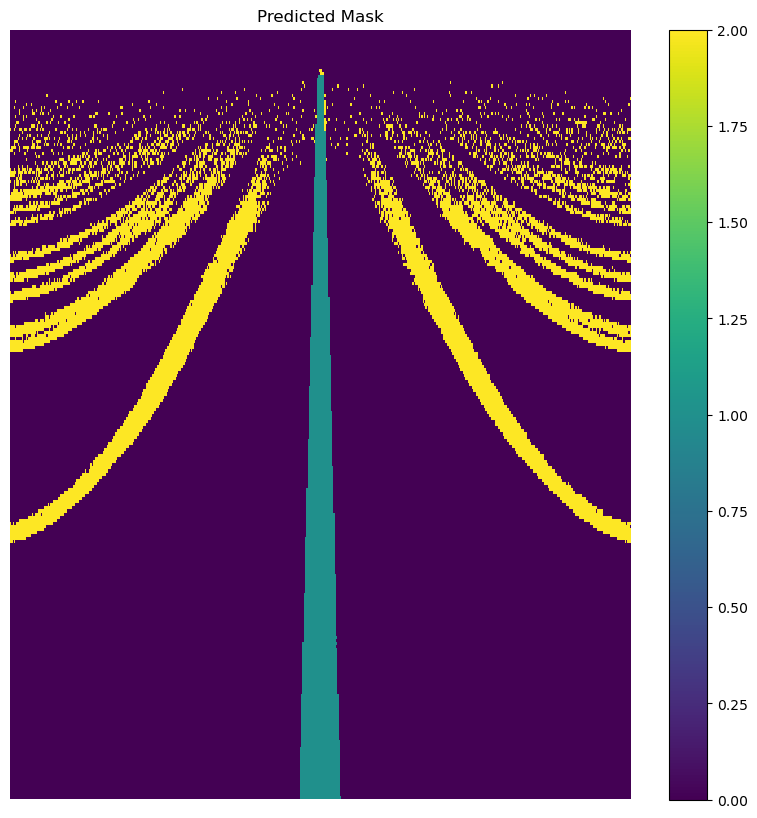

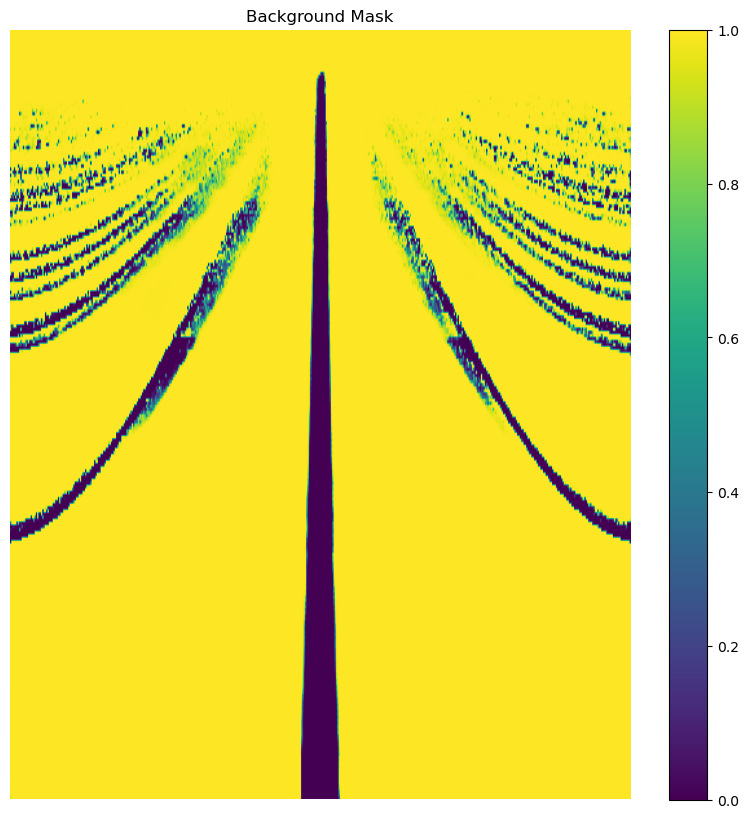

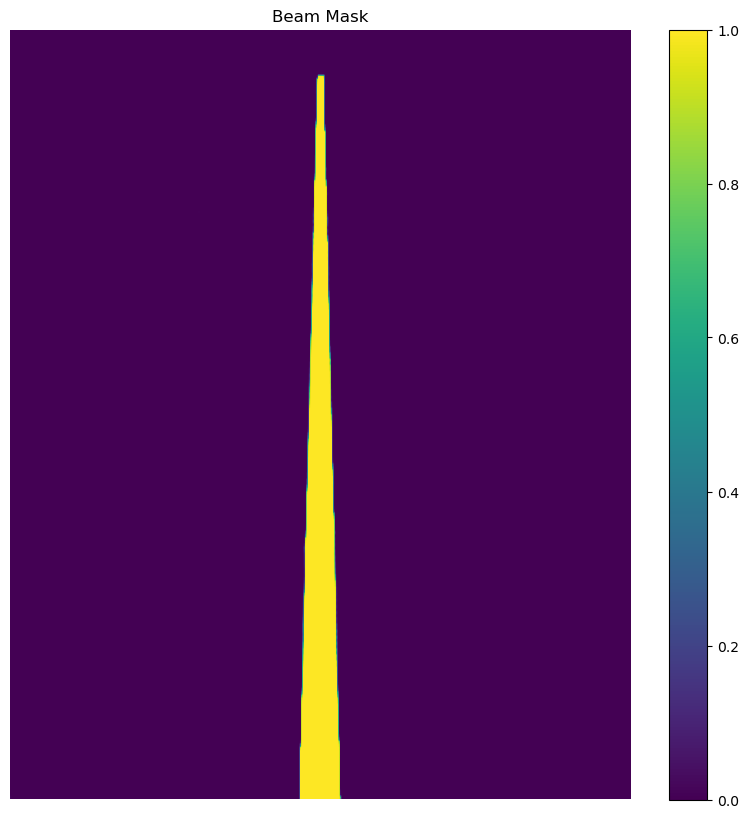

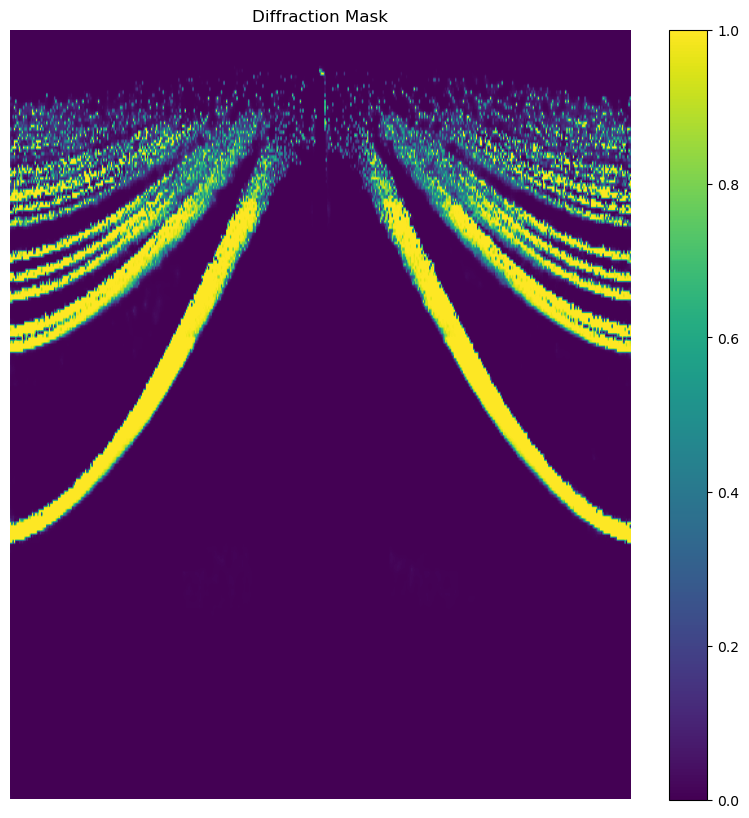

In [ ]:
for targets, tag  in df_test_loader:
    if tag == 6:

        targets = targets.to(device)

        print(targets.size())

        with torch.no_grad():
            # Применяем фильтр к целевому объекту
            output = model(targets)
        
        out = F.softmax(output, dim=1)
        predicted_mask = torch.argmax(F.softmax(output, dim=1), dim=1)[0]  # Размер [height, width]
        #background = out[0][0]
        background = torch.sigmoid(output[0][0])
        beam = out[0][1]
        #beam = torch.sigmoid(output[0][1])
        diff = out[0][2]
        #diff = torch.sigmoid(output[0][2])

        # Преобразуем в numpy для визуализации
        predicted_mask = predicted_mask.cpu().numpy()  # Переносим на CPU и в numpy

        background = background.cpu().numpy()  # Переносим на CPU и в numpy
        beam = beam.cpu().numpy()  # Переносим на CPU и в numpy
        diff = diff.cpu().numpy()  # Переносим на CPU и в numpy

        # Визуализируем итоговую маску
        plt.figure(figsize=(10, 10))
        plt.imshow(targets[0][0].cpu().numpy(), cmap='viridis', aspect='auto', norm = 'log')
        plt.title("Detector diffraction")
        plt.axis('off')
        plt.colorbar()
        plt.show()

        # Визуализируем итоговую маску
        plt.figure(figsize=(10, 10))
        plt.imshow(predicted_mask, cmap='viridis', aspect='auto', interpolation='none')
        plt.title("Predicted Mask")
        plt.axis('off')
        plt.colorbar()
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.imshow(background, cmap='viridis', aspect='auto')
        plt.title("Background Mask")
        plt.axis('off')
        plt.colorbar()
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.imshow(beam, cmap='viridis', aspect='auto')
        plt.title("Beam Mask")
        plt.axis('off')
        plt.colorbar()
        plt.show()

        #diff[diff < 0.99] = 0
        plt.figure(figsize=(10, 10))
        plt.imshow(diff, cmap='viridis', aspect='auto')
        plt.title("Diffraction Mask")
        plt.axis('off')
        plt.colorbar()
        plt.show()


            
    #cr+=1

In [10]:
# Получаем предсказания модели (логиты)
output = model(df_test_tensor)  # output имеет размер [batch_size, 3, height, width]

# Применяем argmax, чтобы получить финальные предсказания классов (0, 1, 2)
# Пример для одного изображения в батче (нужно для визуализации одного примера)
for i in range(len(df_test)):
    predicted_mask = torch.argmax(F.softmax(output, dim=1), dim=1)[i]  # Размер [height, width]

    # Преобразуем в numpy для визуализации
    predicted_mask = predicted_mask.cpu().numpy()  # Переносим на CPU и в numpy

    # Визуализируем итоговую маску
    plt.figure(figsize=(10, 10))
    plt.imshow(predicted_mask, cmap='viridis', aspect='auto', interpolation='none')
    plt.title("Predicted Mask")
    plt.axis('off')
    plt.show()

KeyboardInterrupt: 